In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs, cartopy.feature as cf
import metpy.calc as mpcalc
from metpy import units
from datetime import datetime as dt

In [2]:
ctl = xr.open_dataset('REFL_interpolated.nc')
ctl = ctl.isel(Time=slice(56,77))
ctl_refl = ctl['REFL_10CM_interp'].sel(level=4000)
terr = xr.open_dataset('500_REFL_interpolated.nc')
terr = terr.isel(Time=slice(56,77))
terr_refl = terr['REFL_10CM_interp'].sel(level=4000)

In [3]:
ctl

<xarray.Dataset>
Dimensions:           (south_north: 285, west_east: 393, Time: 21, level: 2)
Coordinates:
    XLONG             (south_north, west_east) float32 ...
    XLAT              (south_north, west_east) float32 ...
    XTIME             (Time) float64 ...
  * Time              (Time) datetime64[ns] 2018-12-14 ... 2018-12-14T05:00:00
    datetime          (Time) datetime64[ns] ...
  * level             (level) int64 1000 4000
Dimensions without coordinates: south_north, west_east
Data variables:
    REFL_10CM_interp  (Time, level, south_north, west_east) float32 ...

In [5]:
diff = ctl_refl - terr_refl

In [6]:
lonW = -100
lonE = -25
latS = -60
latN = 0
cLat, cLon = (latS + latN)/2, (lonW + lonE)/2
proj_map = ccrs.Robinson(central_longitude=cLon)
proj_data = ccrs.PlateCarree()
res = '10m'

In [7]:
lon, lat, time = ctl.XLONG, ctl.XLAT, ctl.XTIME

In [8]:
# remember to edit
startYear = 2018
startMonth = 12
startDay = 14
startHour = 0
startMinute = 0
startDateTime = dt(startYear,startMonth,startDay, startHour, startMinute)

endYear = 2018
endMonth = 12
endDay = 14
endHour = 5
endMinute = 0
endDateTime = dt(endYear,endMonth,endDay, endHour, endMinute)

In [9]:
dateList = pd.date_range(startDateTime, endDateTime, freq='.25H')

In [10]:
diff.min(), diff.max()

(<xarray.DataArray 'REFL_10CM_interp' ()>
 array(-97.73448944)
 Coordinates:
     level    int64 4000,
 <xarray.DataArray 'REFL_10CM_interp' ()>
 array(97.56581879)
 Coordinates:
     level    int64 4000)

In [17]:
levs = np.arange(-100, 100, 5)

In [18]:
import sys, os
import requests
import xarray
import matplotlib.pyplot as plt
import ipywidgets as widgets
import cartopy.crs as ccrs, cartopy.feature as cf
import numpy as np
try:
    import getpass
    input = getpass.getpass
except:
    try:
        input = raw_input
    except:
        pass
pswd = '656800eL*'
values = {'email' : 'elucy1914@gmail.com', 'passwd' : pswd, 'action' : 'login'}
login_url = 'https://rda.ucar.edu/cgi-bin/login'
ret = requests.post(login_url, data=values)
if ret.status_code != 200:
    print('Bad Authentication')
    print(ret.text)
    exit(1)
dspath = 'https://rda.ucar.edu/data/ds759.3/'
filelist = ['etopo2_2001sep/etopo2.nc.gz']
save_dir = ''
for file in filelist:
    filename = dspath + file
    outfile = save_dir + os.path.basename(filename)
    print('Downloading', file)
    req = requests.get(filename, cookies = ret.cookies, allow_redirects=True)
    open(outfile, 'wb').write(req.content)
filelist_arr = [save_dir + os.path.basename(file) for file in filelist]
selected_file = widgets.Dropdown(options=filelist_arr, description='data file')
display(selected_file)
ds = xarray.open_dataset(selected_file.value)
def get_time(dataset):
    for _,cur_coord in dataset.coords.items:
        if cur_coord.attrs['standard_name'] == 'time':
            return cur_coord
def get_lat(dataset):
    for _,cur_coord in dataset.coords.items:
        if cur_coord.attrs['standard_name'] == 'longitude':
            return cur_coord
def get_lon(dataset):
    for _,cur_coord in dataset.coords.items:
        if cur_coord.attrs['standard_name'] == 'latitude':
            return cur_coord

def get_primary(dataset):
    primary_variables = {}
    coords = dataset.coords.keys()
    highest_dims = 0
    for cur_key,cur_var in dataset.variables.items():
        if cur_key not in coords:
            primary_variables[cur_key] = cur_var
    return primary_variables 
var = widgets.Dropdown(
    options=get_primary(ds).keys(),
    description='Variable')
display(var)
x=ds['btdata'].sel(lat=slice(-25,-39))
y = x.sel(lon=slice(-70,-55))

Dropdown(description='data file', options=('etopo2.nc.gz',), value='etopo2.nc.gz')

Dropdown(description='Variable', options=('btdata',), value='btdata')

/tmp/ipykernel_844180/3424666446.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(18,12))


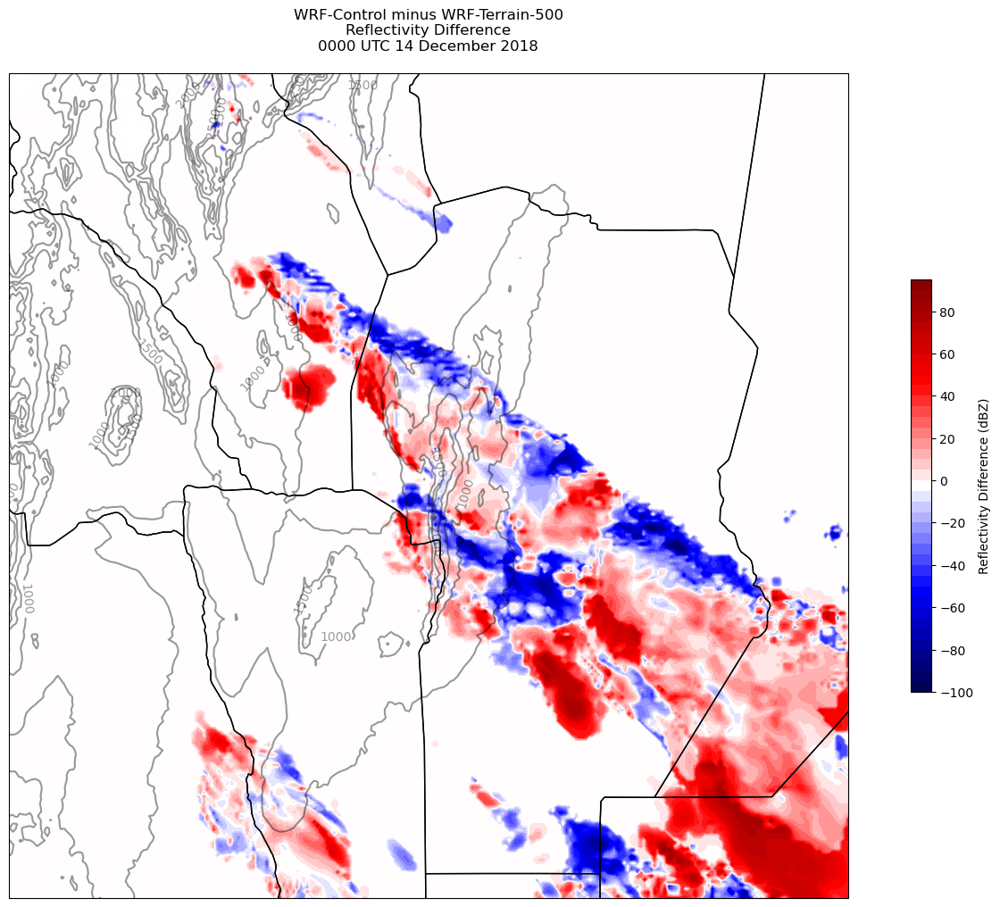

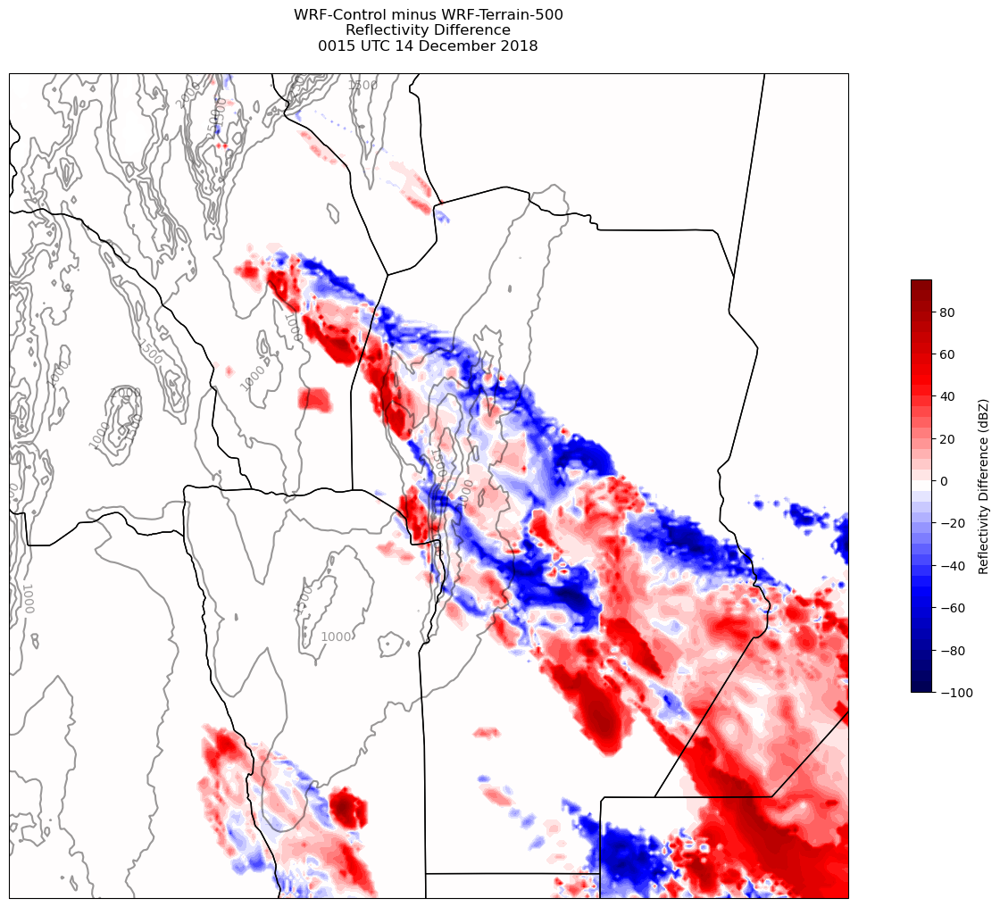

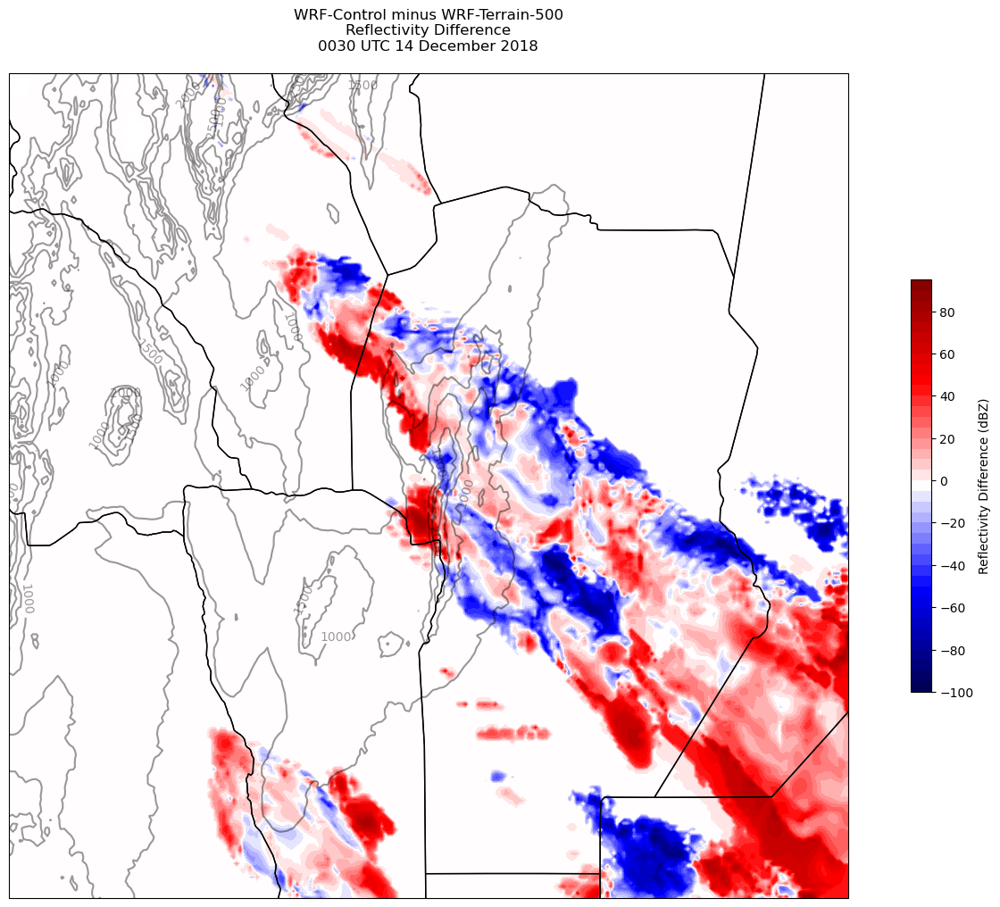

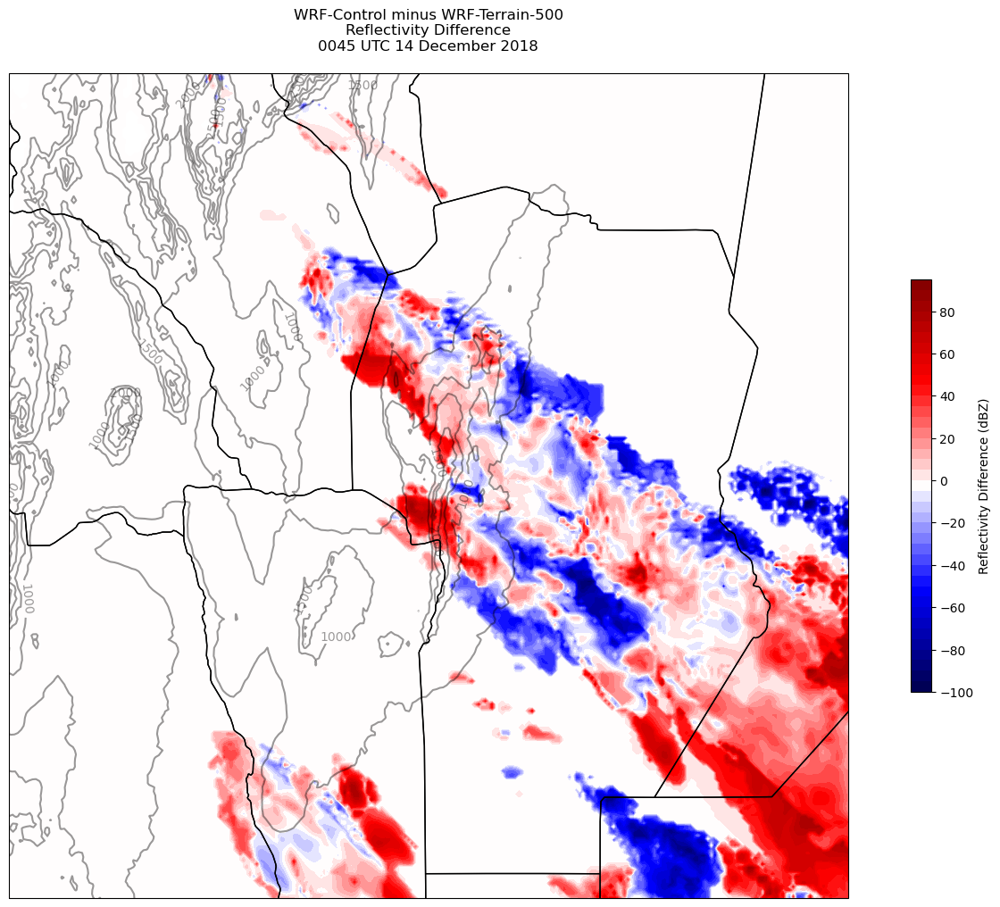

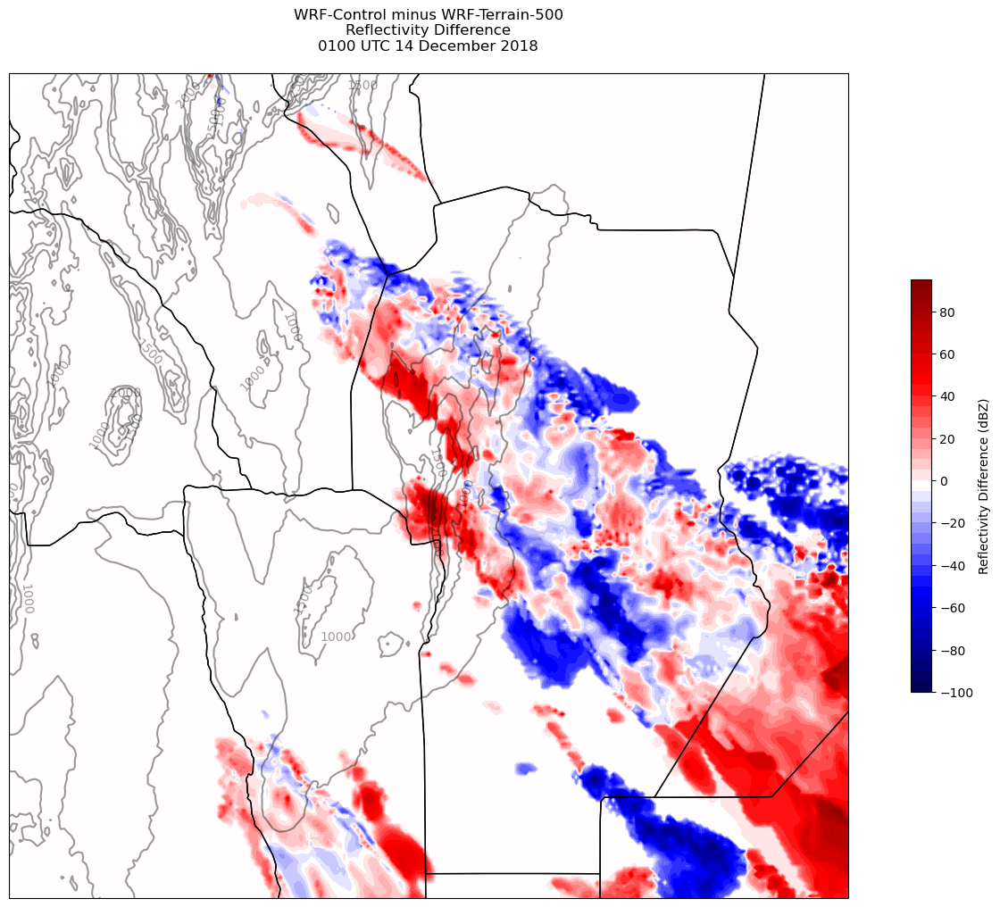

...

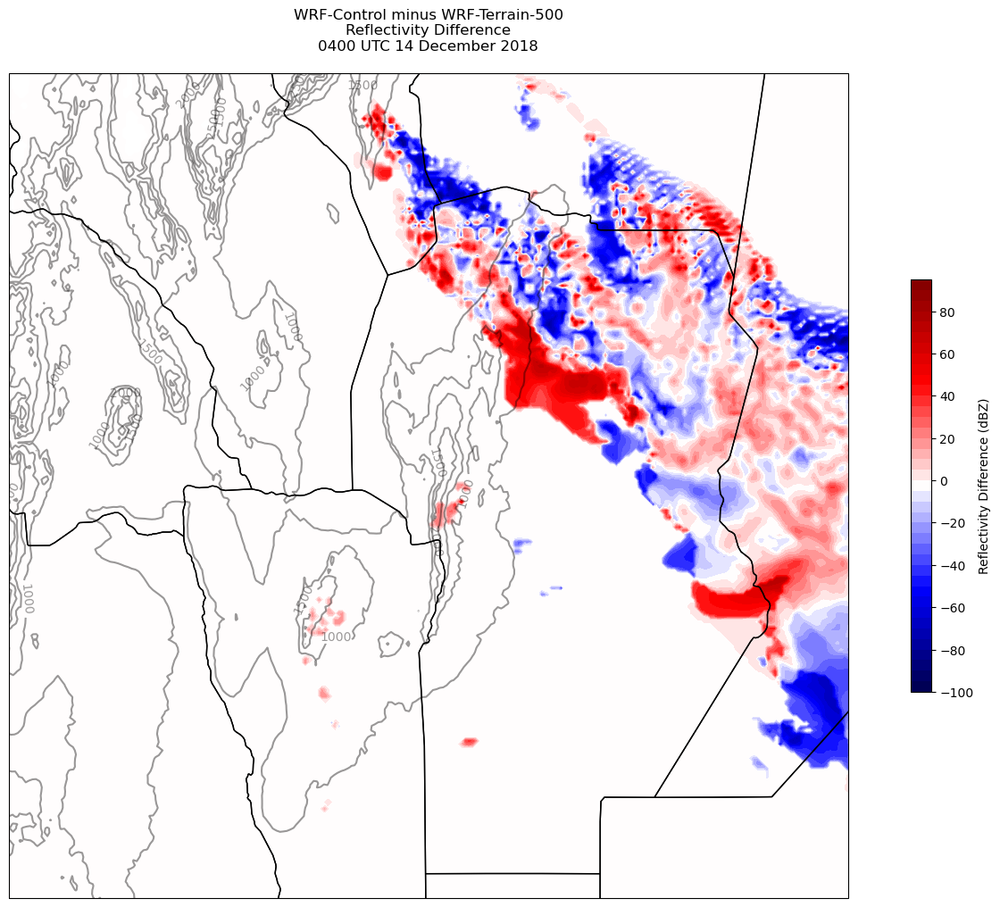

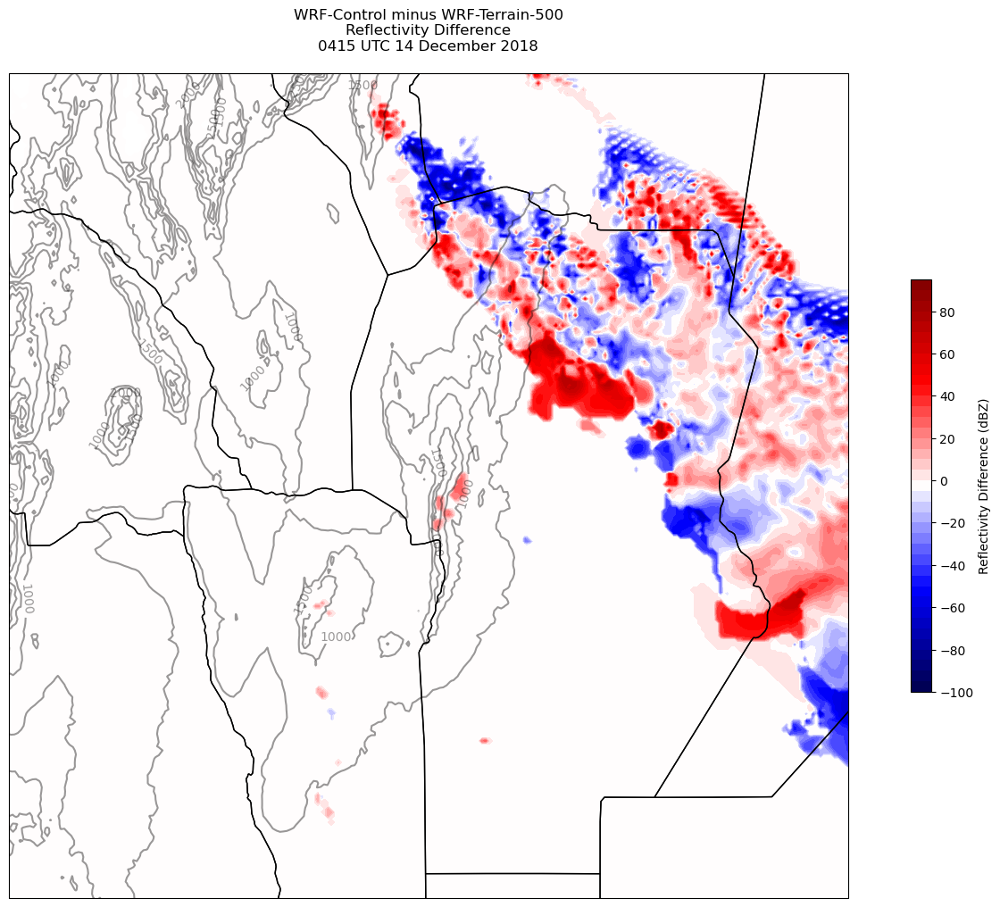

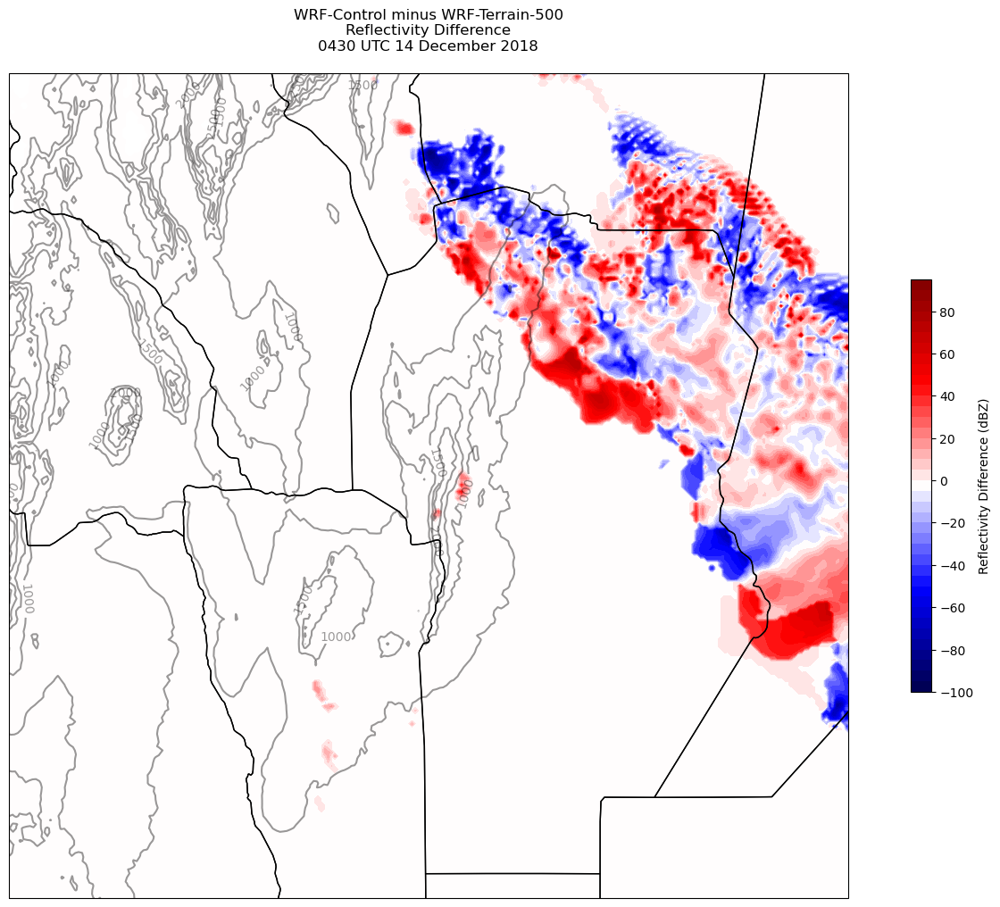

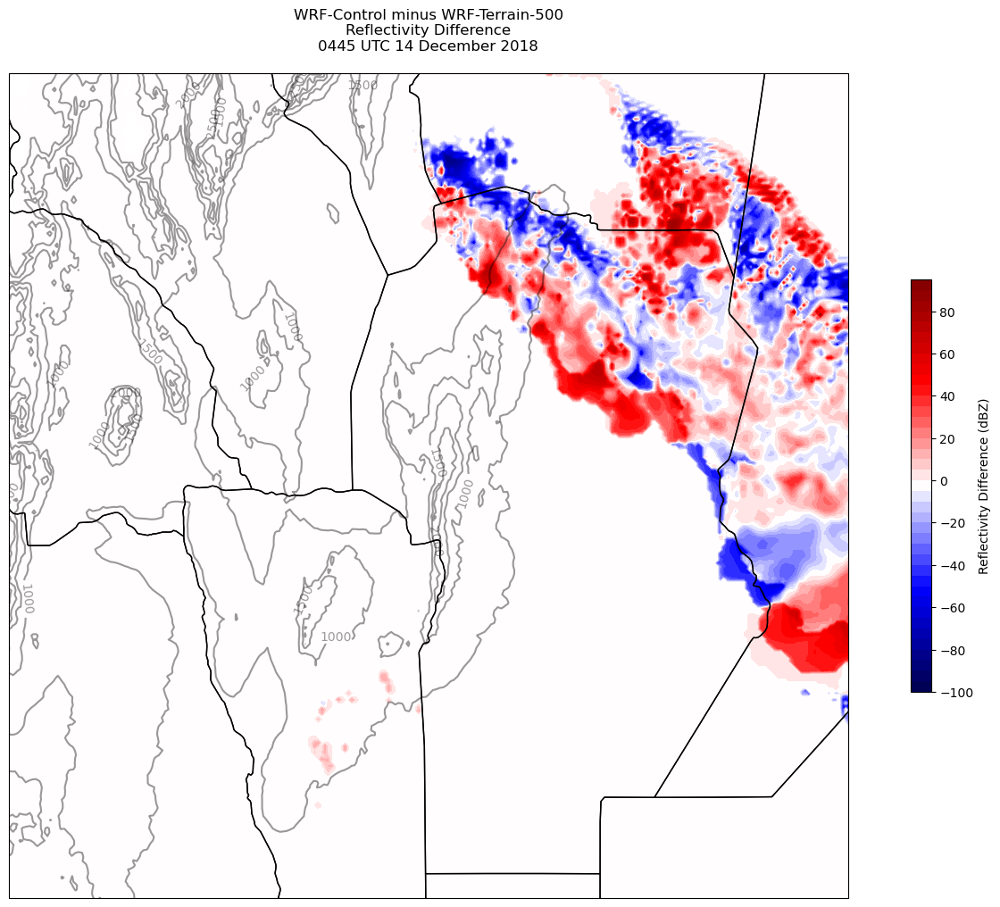

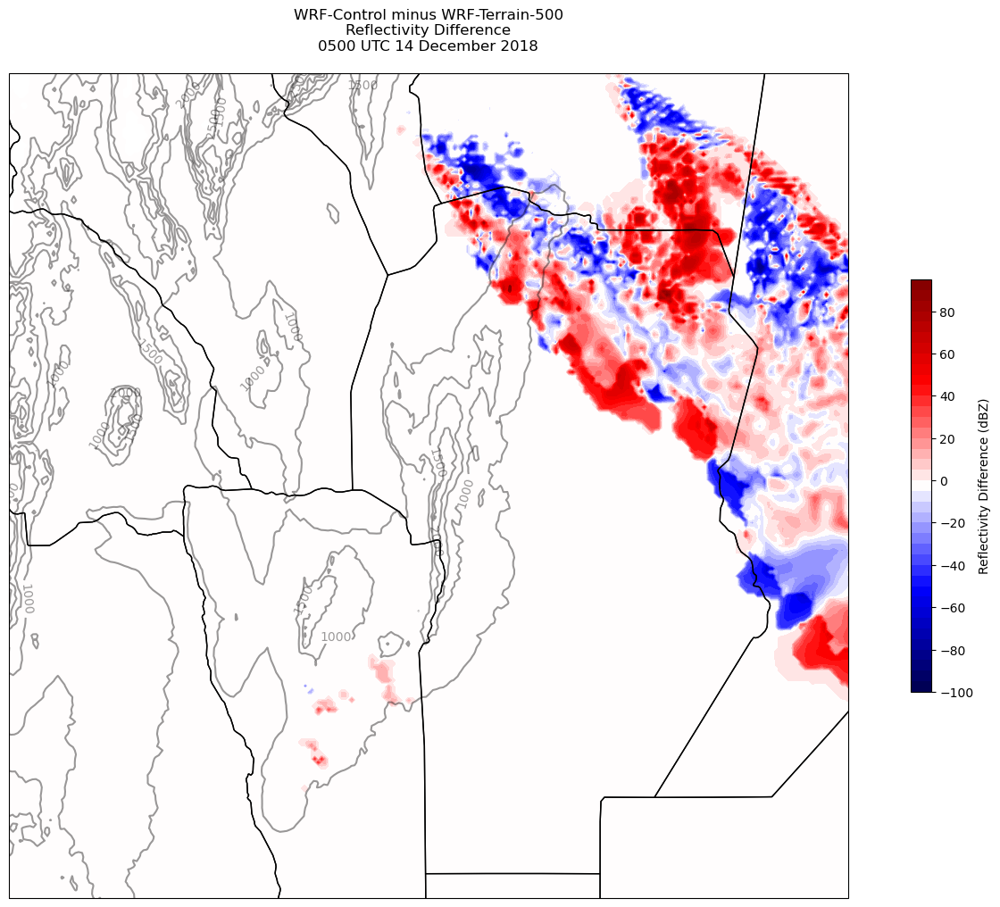

In [19]:
i=0
for value in time:
    fig = plt.figure(figsize=(18,12)) 
    ax = plt.subplot(1,1,1,projection=proj_map)
    ax.set_extent ([lonW+31,lonE-36,latS+24.8,latN-28.5])
    ax.add_feature(cf.COASTLINE.with_scale(res))
    ax.add_feature(cf.STATES.with_scale(res))
    
    CF = ax.contourf(lon, lat, diff.isel(Time=i), levels=levs, cmap='seismic', transform=proj_data)
    cbar = fig.colorbar(CF,shrink=0.5)
    cbar.set_label(r'Reflectivity Difference (dBZ)', size='medium')
    
    CL = ax.contour(y.lon, y.lat, y, levels=np.arange(500, 3000, 500), colors='k', transform=proj_data, alpha=.4)
    ax.clabel(CL)
    
    timeStr = dt.strftime(dateList[i], format='%H%M UTC %d %B %Y')
    
    tl1 = 'WRF-Control minus WRF-Terrain-500'
    tl2 = 'Reflectivity Difference'
    tl3 = timeStr
    title_line = (tl1 + '\n' + tl2 + '\n' + tl3 + '\n')
    
    plt.title(title_line)
    
    i=i+1

In [20]:
ds1 = xr.open_dataset('WRF_interpolated.nc')
ds2 = xr.open_dataset('500_WRF_interpolated.nc')
ds1 = ds1.isel(Time=slice(56,77))
ds2 = ds2.isel(Time=slice(56,77))

In [21]:
w_ctl = ds1['w']
w_terr = ds2['w']

In [23]:
w_diff = w_ctl-w_terr

In [24]:
w_diff

<xarray.DataArray 'w' (Time: 21, level: 180, south_north: 285, west_east: 393)>
array([[[[-5.83523419e-04, -2.07612524e-04, -4.20852564e-04, ...,
                      nan,             nan,             nan],
         [ 5.54623664e-04,  1.98806752e-03,  4.49560815e-03, ...,
                      nan,             nan,             nan],
         [ 2.49395613e-04,  9.76793468e-04,  1.68108055e-03, ...,
                      nan,             nan,             nan],
         ...,
         [ 2.52125319e-05, -1.45141990e-03, -7.98283261e-04, ...,
                      nan,             nan,             nan],
         [ 1.06364489e-04, -5.68032032e-04,  6.64788997e-04, ...,
                      nan,             nan,             nan],
         [ 1.80881878e-04,  2.97451799e-04,  5.17280889e-04, ...,
                      nan,             nan,             nan]],

        [[-5.67496871e-04, -1.59721822e-07, -2.58487184e-04, ...,
                      nan,             nan,             nan],
         [ 9.70720546e-04,  2.62951129e-03,  4.49139252e-03, ...,
                      nan,             nan,             nan],
         [ 5.49264252e-04,  1.75328925e-03,  2.58440711e-03, ...,
                      nan,             nan,             nan],
...
           5.45905679e-02,  4.18858677e-02,  5.67469522e-02],
         [-5.09372167e-03, -3.45695764e-03, -3.51649523e-03, ...,
           4.89004776e-02,  3.62234563e-02,  5.37557825e-02],
         [-4.83264774e-03, -4.93386015e-03, -5.06645814e-03, ...,
           4.63450775e-02,  4.29216400e-02,  3.94722298e-02]],

        [[ 1.25286253e-02,  1.49945188e-02,  1.44084254e-02, ...,
          -4.86770496e-02, -4.24125604e-02, -4.26370054e-02],
         [ 1.17786443e-02,  1.09545914e-02,  1.18852481e-02, ...,
          -4.58768904e-02, -6.13442659e-02, -5.41159138e-02],
         [ 9.11350548e-03,  8.00183788e-03,  6.97708037e-03, ...,
          -5.60726710e-02, -7.51708001e-02, -6.74763769e-02],
         ...,
         [-5.33310138e-03, -3.75029258e-03, -4.17289138e-03, ...,
           5.51643148e-02,  4.34535593e-02,  5.91916889e-02],
         [-5.15952148e-03, -3.49849090e-03, -3.79022956e-03, ...,
           5.34504056e-02,  4.18717414e-02,  5.90250343e-02],
         [-4.94638644e-03, -5.09399362e-03, -5.25617786e-03, ...,
           5.35942838e-02,  5.11194691e-02,  4.84041572e-02]]]],
      dtype=float32)
Coordinates:
    XLONG     (south_north, west_east) float32 -73.37 -73.34 ... -60.72 -60.69
    XLAT      (south_north, west_east) float32 -35.52 -35.53 ... -28.13 -28.13
    XTIME     (Time) float64 840.0 855.0 870.0 ... 1.11e+03 1.125e+03 1.14e+03
  * Time      (Time) datetime64[ns] 2018-12-14 ... 2018-12-14T05:00:00
    datetime  (Time) datetime64[ns] 2018-12-14 ... 2018-12-14T05:00:00
  * level     (level) float64 1e+05 9.95e+04 9.9e+04 ... 1.1e+04 1.05e+04
Dimensions without coordinates: south_north, west_east

In [31]:
wdiff925 = w_diff.sel(level=92500)
wdiff920 = w_diff.sel(level=92000)
wdiff915 = w_diff.sel(level=91500)
wdiff910 = w_diff.sel(level=91000)
wdiff905 = w_diff.sel(level=90500)
wdiff900 = w_diff.sel(level=90000)
wdiff895 = w_diff.sel(level=89500)
wdiff890 = w_diff.sel(level=89000)
wdiff885 = w_diff.sel(level=88500)
wdiff880 = w_diff.sel(level=88000)
wdiff875 = w_diff.sel(level=87500)
wdiff870 = w_diff.sel(level=87000)
wdiff865 = w_diff.sel(level=86500)
wdiff860 = w_diff.sel(level=86000)
wdiff855 = w_diff.sel(level=85500)
wdiff850 = w_diff.sel(level=85000)
wdiff845 = w_diff.sel(level=84500)
wdiff840 = w_diff.sel(level=84000)
wdiff835 = w_diff.sel(level=83500)
wdiff830 = w_diff.sel(level=83000)
wdiff825 = w_diff.sel(level=82500)
wdiff820 = w_diff.sel(level=82000)
wdiff815 = w_diff.sel(level=81500)
wdiff810 = w_diff.sel(level=81000)
wdiff805 = w_diff.sel(level=80500)
wdiff800 = w_diff.sel(level=80000)
wdiff795 = w_diff.sel(level=79500)
wdiff790 = w_diff.sel(level=79000)
wdiff785 = w_diff.sel(level=78500)
wdiff780 = w_diff.sel(level=78000)
wdiff775 = w_diff.sel(level=77500)
wdiff770 = w_diff.sel(level=77000)
wdiff765 = w_diff.sel(level=76500)
wdiff760 = w_diff.sel(level=76000)
wdiff755 = w_diff.sel(level=75500)
wdiff750 = w_diff.sel(level=75000)
wdiff745 = w_diff.sel(level=74500)
wdiff740 = w_diff.sel(level=74000)
wdiff735 = w_diff.sel(level=73500)
wdiff730 = w_diff.sel(level=73000)
wdiff725 = w_diff.sel(level=72500)
wdiff720 = w_diff.sel(level=72000)
wdiff715 = w_diff.sel(level=71500)
wdiff710 = w_diff.sel(level=71000)
wdiff705 = w_diff.sel(level=70500)
wdiff700 = w_diff.sel(level=70000)
wdiff695 = w_diff.sel(level=69500)
wdiff690 = w_diff.sel(level=69000)
wdiff685 = w_diff.sel(level=68500)
wdiff680 = w_diff.sel(level=68000)
wdiff675 = w_diff.sel(level=67500)
wdiff670 = w_diff.sel(level=67000)
wdiff665 = w_diff.sel(level=66500)
wdiff660 = w_diff.sel(level=66000)
wdiff655 = w_diff.sel(level=65500)
wdiff650 = w_diff.sel(level=65000)

In [33]:
w_diff.max(), w_diff.min()

(<xarray.DataArray 'w' ()>
 array(55.4995079),
 <xarray.DataArray 'w' ()>
 array(-58.02690887))

In [34]:
w_diff_levs = np.arange(-60,60,2)

/tmp/ipykernel_844180/3076153592.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(18,12))


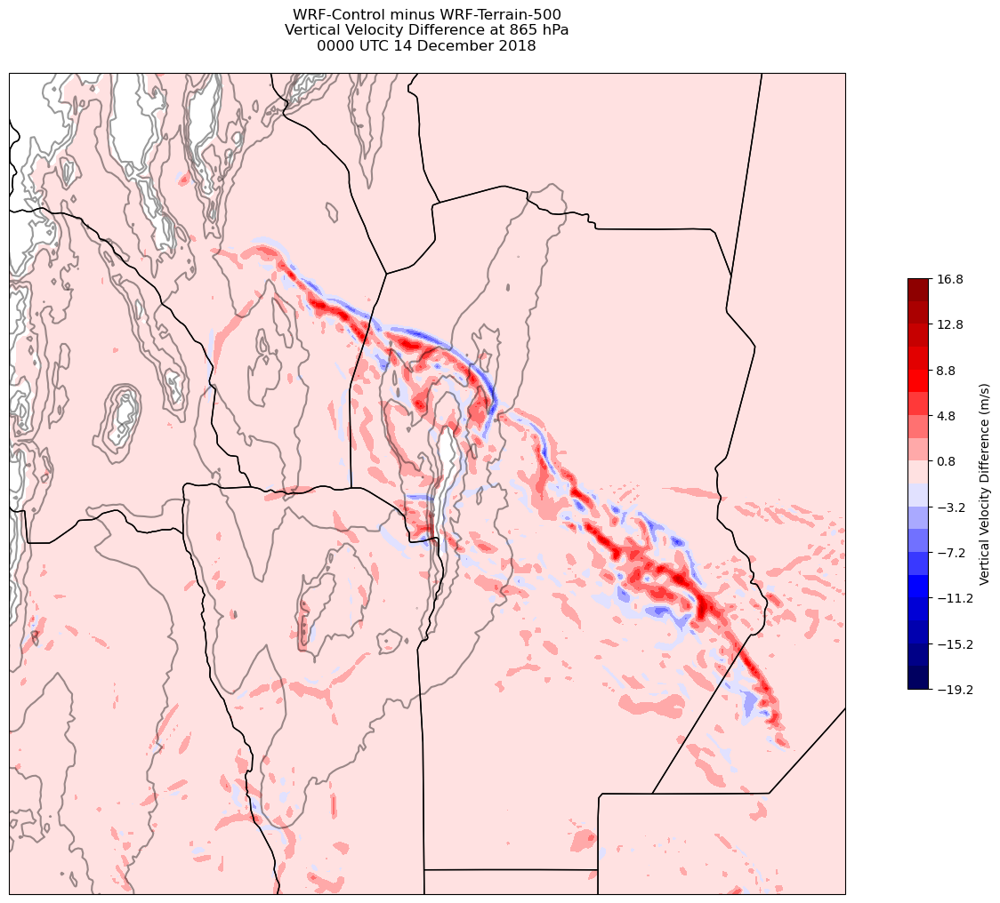

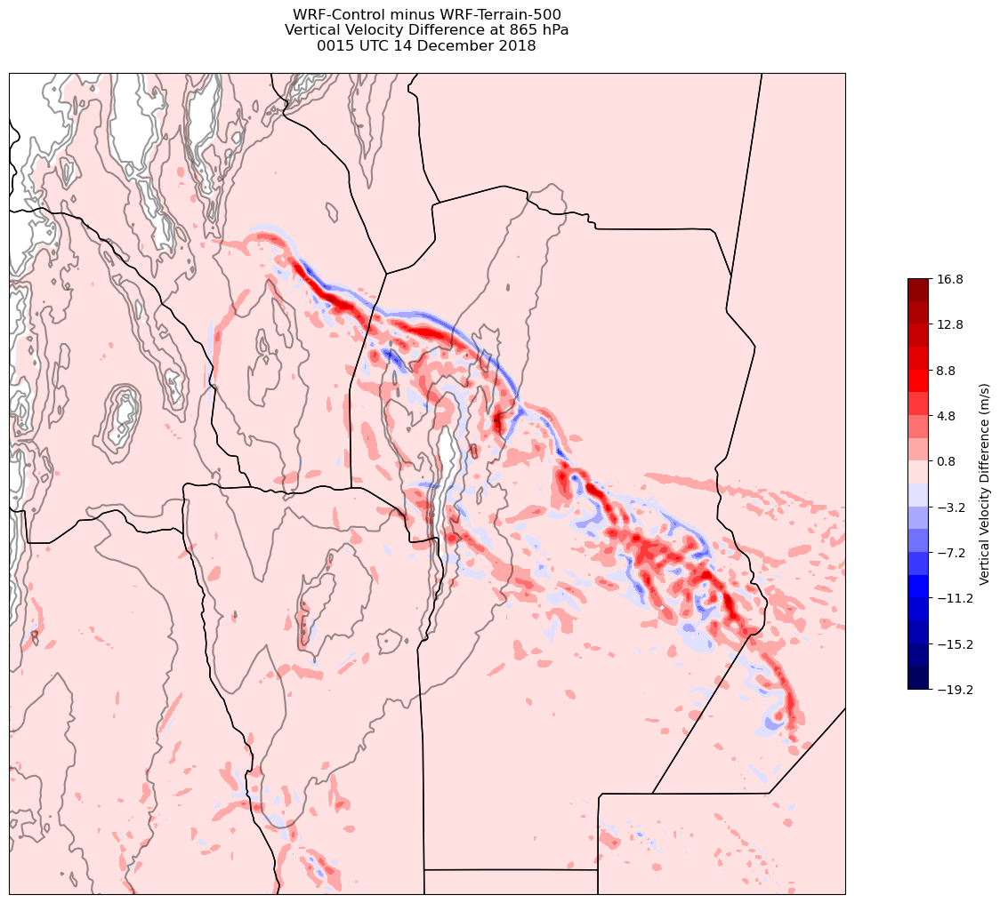

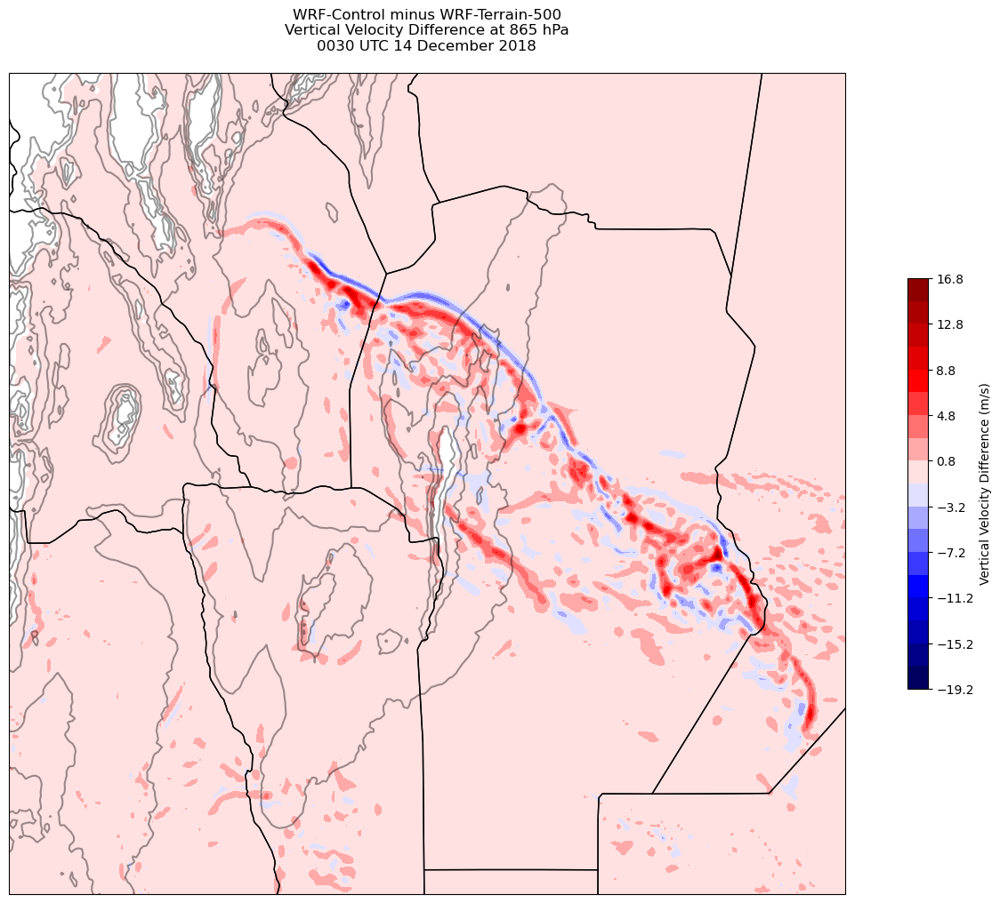

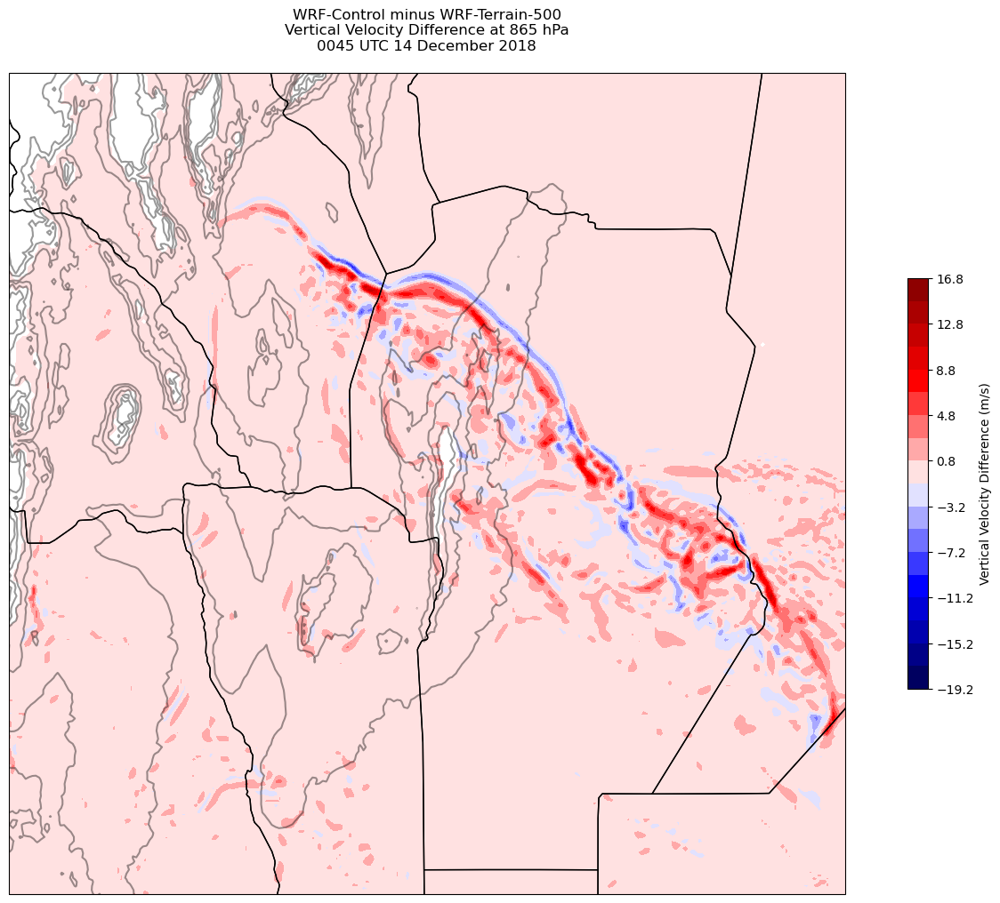

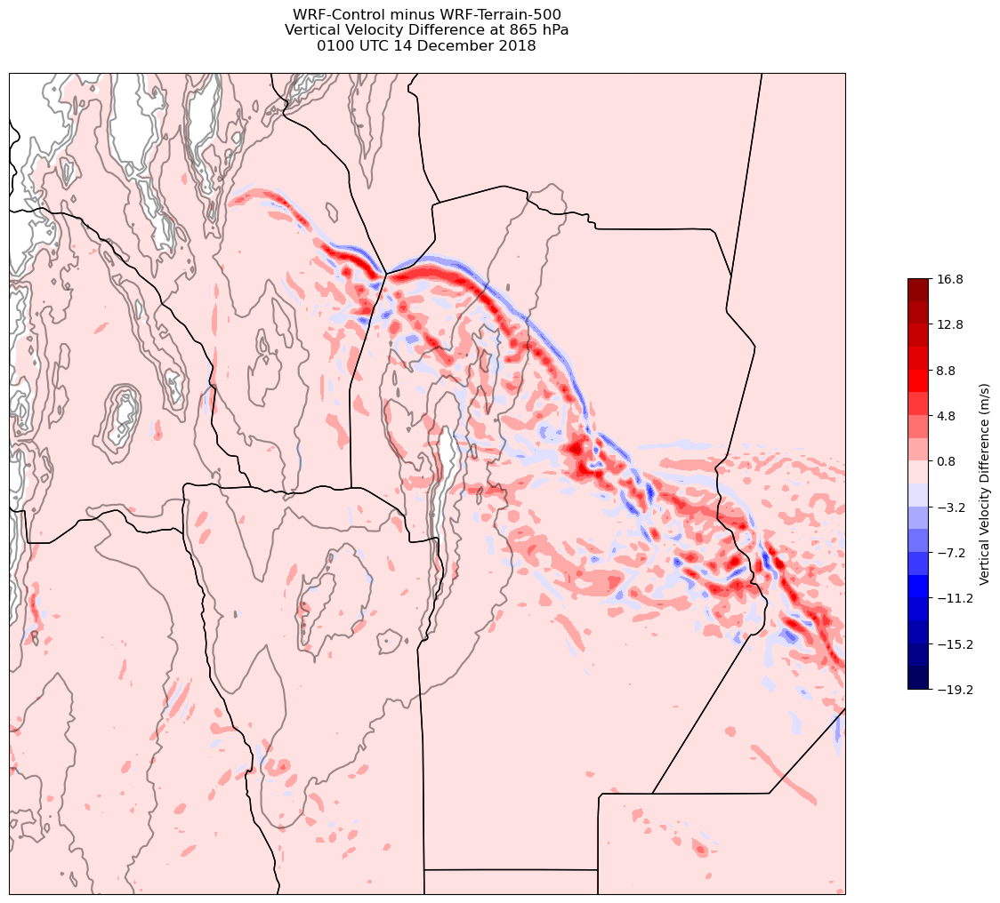

...

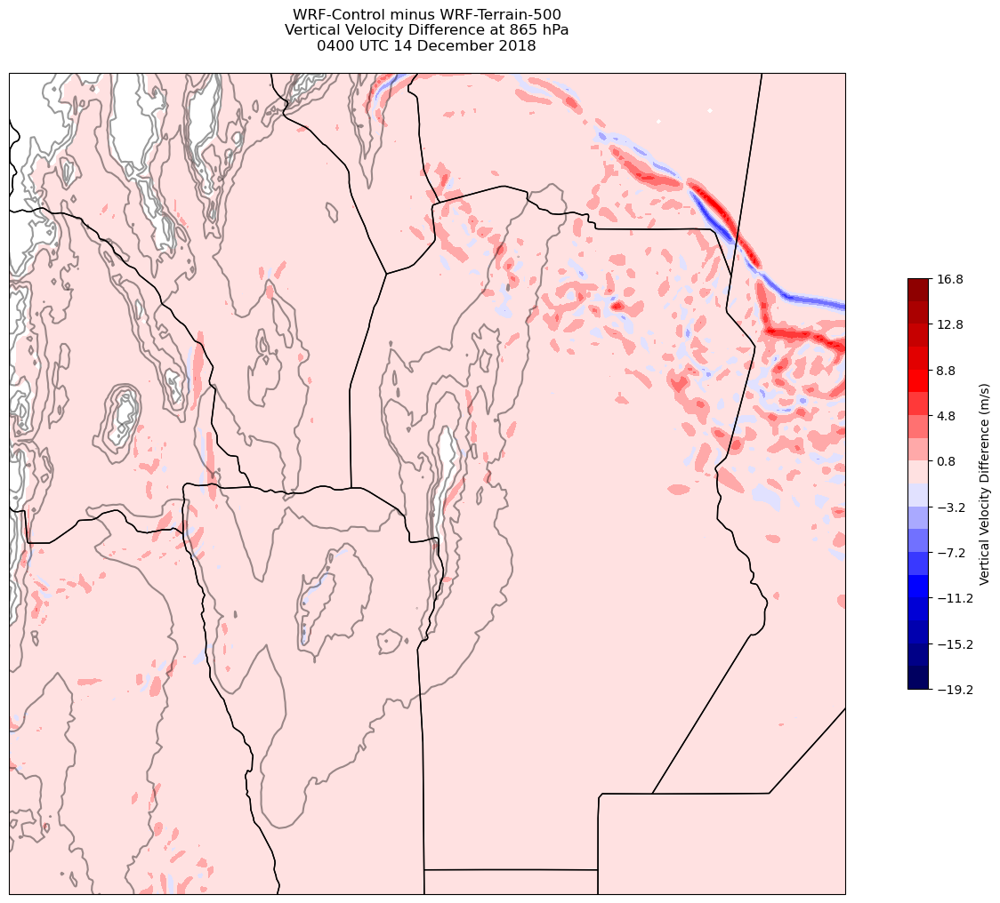

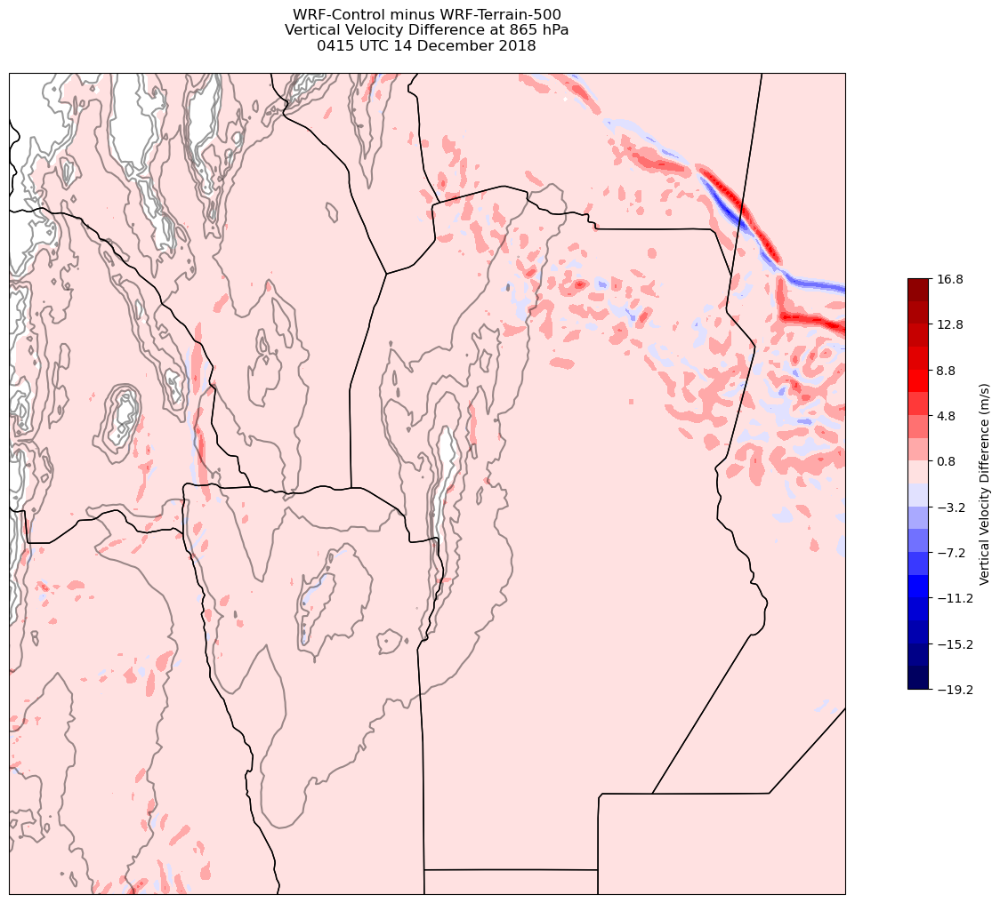

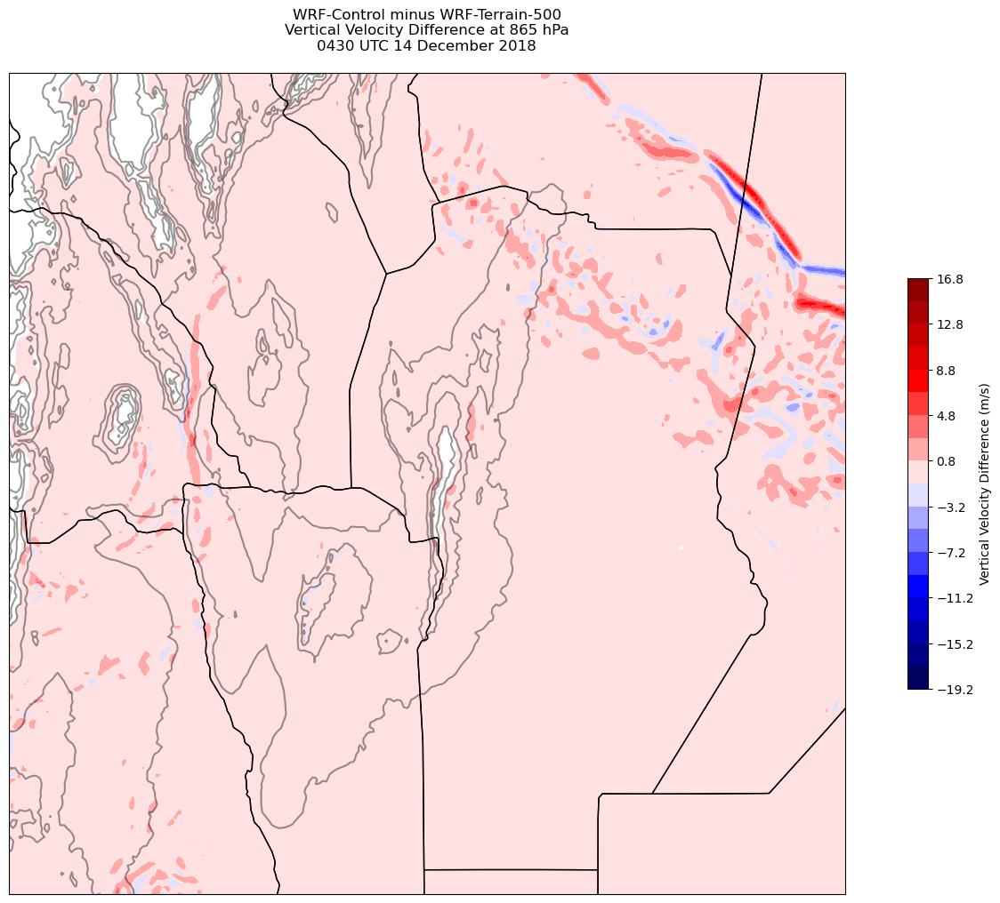

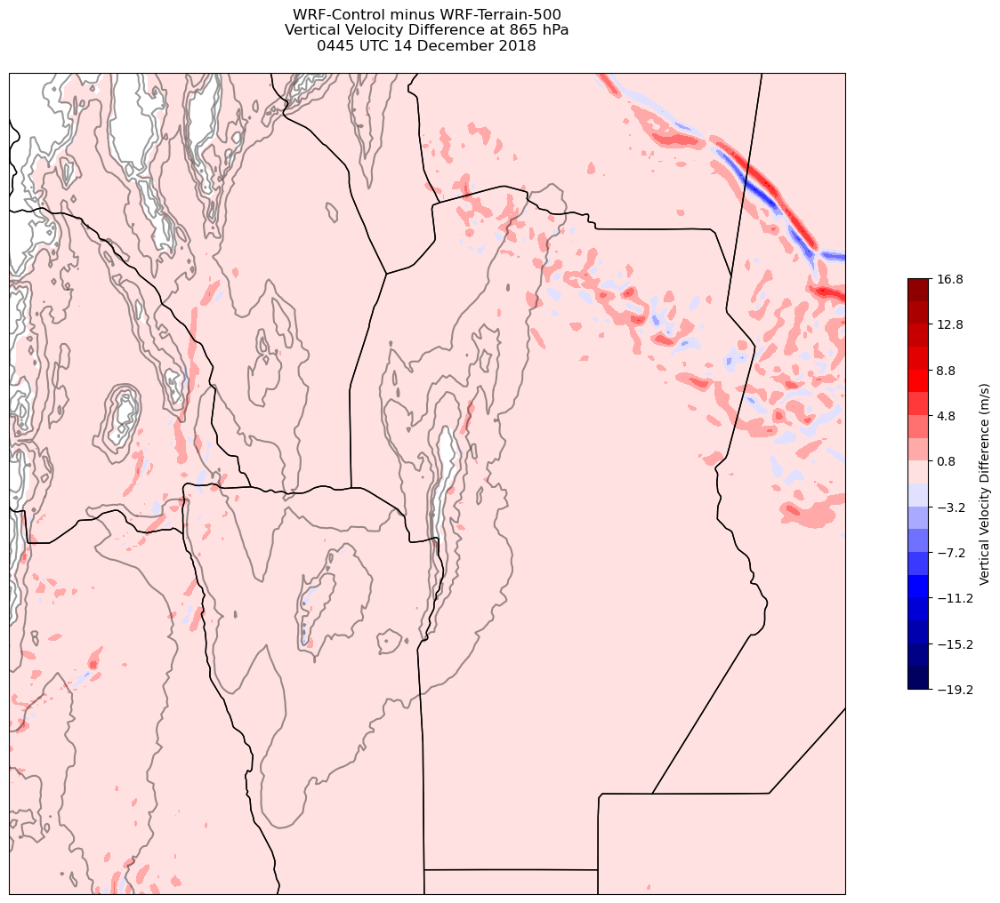

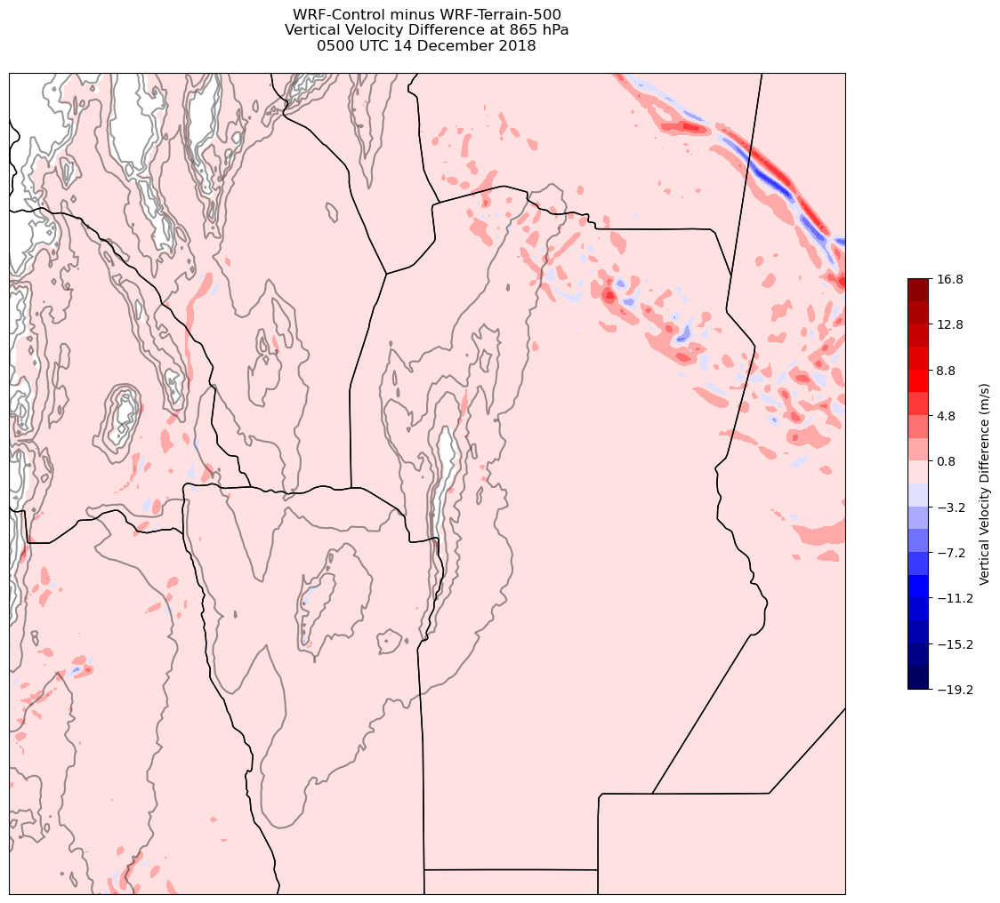

In [64]:
i=0
for value in time:
    fig = plt.figure(figsize=(18,12)) 
    ax = plt.subplot(1,1,1,projection=proj_map)
    ax.set_extent ([lonW+31,lonE-36,latS+24.8,latN-28.5])
    ax.add_feature(cf.COASTLINE.with_scale(res))
    ax.add_feature(cf.STATES.with_scale(res))
    
    CF = ax.contourf(lon, lat, wdiff790.isel(Time=i), levels=np.arange(wdiff790.min(),wdiff790.max()+2,2), cmap='seismic', transform=proj_data)
    cbar = fig.colorbar(CF,shrink=0.5)
    cbar.set_label(r'Vertical Velocity Difference (m/s)', size='medium')
    
    CL = ax.contour(y.lon, y.lat, y, levels=np.arange(500, 3000, 500), colors='k', transform=proj_data, alpha=.4)
    
    
    timeStr = dt.strftime(dateList[i], format='%H%M UTC %d %B %Y')
    
    tl1 = 'WRF-Control minus WRF-Terrain-500'
    tl2 = 'Vertical Velocity Difference at 865 hPa'
    tl3 = timeStr
    title_line = (tl1 + '\n' + tl2 + '\n' + tl3 + '\n')
    
    plt.title(title_line)
    
    i=i+1